# Data Importing and preprocessing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:
df=pd.read_excel('sydney_rain_prediction.xlsx',)

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes
1,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes
2,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes
3,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes
4,2008-02-05,Sydney,19.7,25.7,77.4,NaN,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes


In [4]:
df.shape

(3337, 17)

# EDD(Univariate Analysis)

In [5]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,3334.000000,3335.000000,3331.000000,3286.000000,3321.000000,3323.000000,3324.000000,3317.000000,3318.000000,2771.000000,2776.000000,3333.000000,3333.000000
mean,14.865057,23.002339,3.330231,5.187432,7.179374,68.229010,54.699158,1018.346156,1016.018774,4.181523,4.218660,17.819742,21.533333
std,4.553641,4.494638,9.895172,2.777407,3.810886,15.085355,16.293530,7.021571,7.032211,2.749578,2.641885,4.897177,4.303737
min,4.300000,11.700000,0.000000,0.000000,0.000000,19.000000,10.000000,986.700000,989.800000,0.000000,0.000000,6.400000,10.200000
25%,11.000000,19.600000,0.000000,3.200000,4.300000,58.000000,44.000000,1013.700000,1011.300000,1.000000,1.000000,13.800000,18.400000
50%,14.900000,22.800000,0.000000,4.800000,8.300000,69.000000,56.000000,1018.600000,1016.300000,5.000000,4.000000,18.200000,21.300000
75%,18.700000,26.000000,1.400000,7.000000,10.200000,80.000000,65.000000,1023.100000,1020.800000,7.000000,7.000000,21.700000,24.500000
max,27.600000,45.800000,119.400000,18.400000,13.600000,100.000000,99.000000,1039.000000,1036.700000,9.000000,8.000000,36.500000,44.700000


In [6]:
import seaborn as sns 

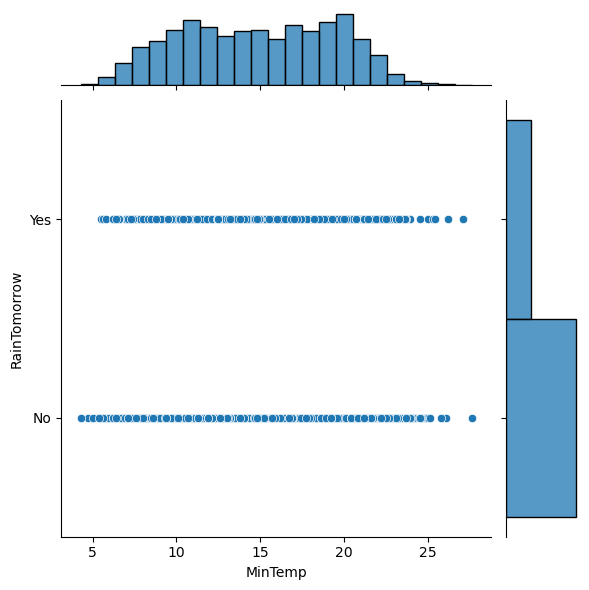

In [7]:
sns.jointplot(x='MinTemp',y='RainTomorrow',data=df)

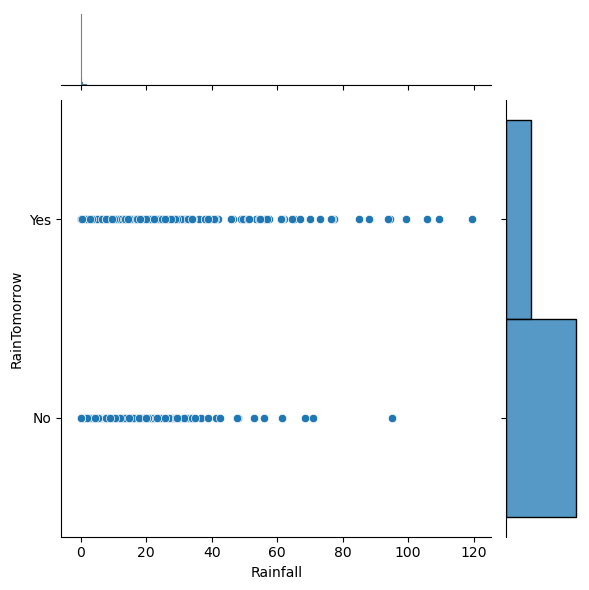

In [8]:
sns.jointplot(x='Rainfall',y='RainTomorrow',data=df)

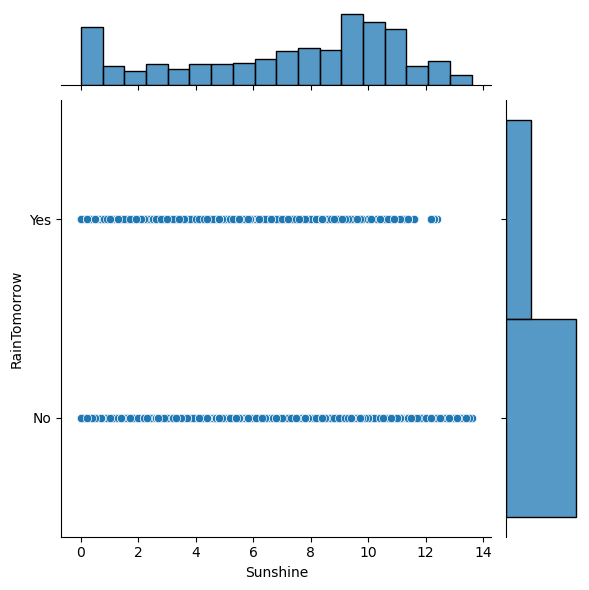

In [9]:
sns.jointplot(x='Sunshine',y='RainTomorrow',data=df)

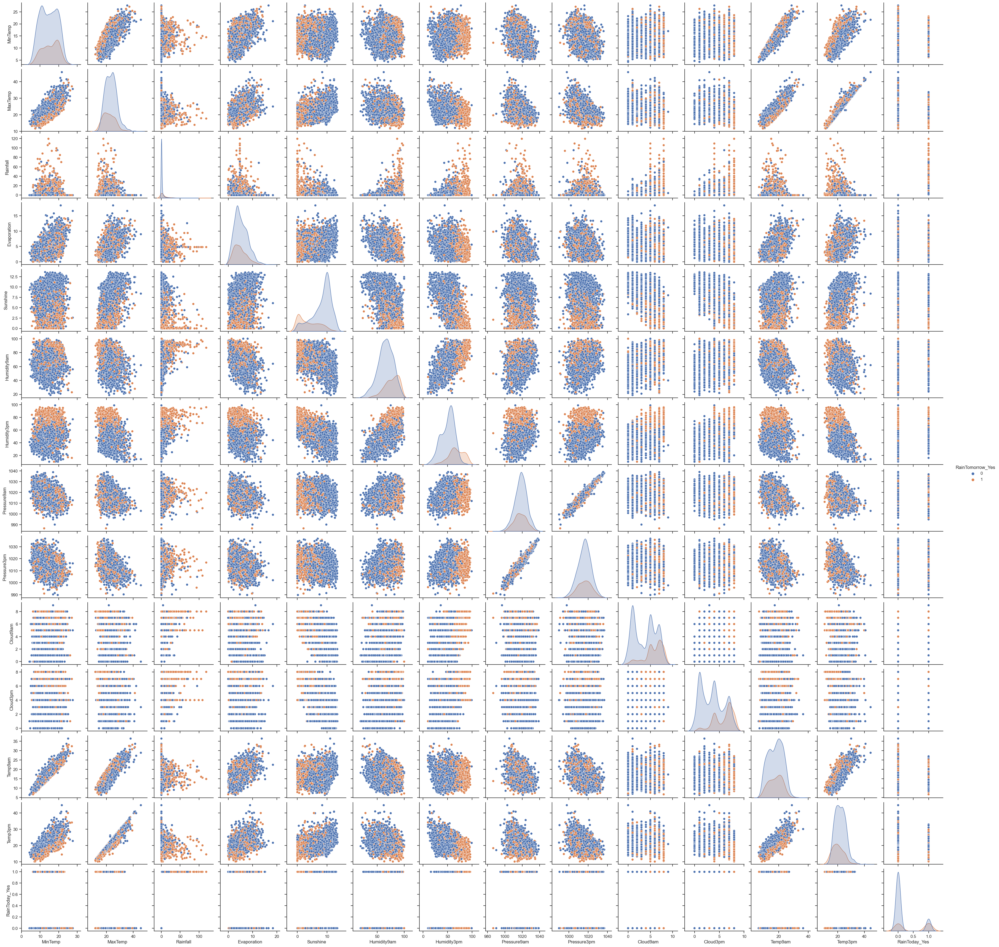

In [169]:
# Create the pair plot

columns_for_pairplot = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
                        'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
                        'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']

sns.set(style="ticks")
sns.pairplot(df[columns_for_pairplot], hue="RainTomorrow_Yes", diag_kind="kde")
plt.show()


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3337 entries, 0 to 3336
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          3337 non-null   datetime64[ns]
 1   Location      3337 non-null   object        
 2   MinTemp       3334 non-null   float64       
 3   MaxTemp       3335 non-null   float64       
 4   Rainfall      3331 non-null   float64       
 5   Evaporation   3286 non-null   float64       
 6   Sunshine      3321 non-null   float64       
 7   Humidity9am   3323 non-null   float64       
 8   Humidity3pm   3324 non-null   float64       
 9   Pressure9am   3317 non-null   float64       
 10  Pressure3pm   3318 non-null   float64       
 11  Cloud9am      2771 non-null   float64       
 12  Cloud3pm      2776 non-null   float64       
 13  Temp9am       3333 non-null   float64       
 14  Temp3pm       3333 non-null   float64       
 15  RainToday     3331 non-null   object  

# Missing Value Imputation

In [12]:
numeric_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 
                   'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 
                   'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

In [13]:
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].median())


In [14]:
df.dropna(subset=['Location'],inplace=True)

In [15]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes
1,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes
2,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes
3,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes
4,2008-02-05,Sydney,19.7,25.7,77.4,4.8,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes


# Dummy Variable Creation

In [16]:
df=pd.get_dummies(df,columns=['RainToday','RainTomorrow'],drop_first=True)

In [17]:
# Preprocess "Date" column into numerical features
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df.drop(columns=['Date'], inplace=True)

In [18]:
df = pd.get_dummies(df, columns=['Location'], drop_first=True)


In [19]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,RainTomorrow_Yes,Year,Month,Day
0,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1,1,2008,2,1
1,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,1,1,2008,2,2
2,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,1,1,2008,2,3
3,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,1,1,2008,2,4
4,19.7,25.7,77.4,4.8,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,1,1,2008,2,5


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3337 entries, 0 to 3336
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MinTemp           3337 non-null   float64
 1   MaxTemp           3337 non-null   float64
 2   Rainfall          3337 non-null   float64
 3   Evaporation       3337 non-null   float64
 4   Sunshine          3337 non-null   float64
 5   Humidity9am       3337 non-null   float64
 6   Humidity3pm       3337 non-null   float64
 7   Pressure9am       3337 non-null   float64
 8   Pressure3pm       3337 non-null   float64
 9   Cloud9am          3337 non-null   float64
 10  Cloud3pm          3337 non-null   float64
 11  Temp9am           3337 non-null   float64
 12  Temp3pm           3337 non-null   float64
 13  RainToday_Yes     3337 non-null   uint8  
 14  RainTomorrow_Yes  3337 non-null   uint8  
 15  Year              3337 non-null   int64  
 16  Month             3337 non-null   int64  


# Correlation Heatmap

RainTomorrow_Yes    1.000000
Sunshine            0.521357
Humidity3pm         0.471224
Cloud3pm            0.411826
RainToday_Yes       0.340894
Cloud9am            0.331352
Humidity9am         0.328952
Rainfall            0.293675
Temp3pm             0.188912
MaxTemp             0.149253
MinTemp             0.079958
Evaporation         0.065904
Month               0.048052
Pressure9am         0.032519
Day                 0.020466
Pressure3pm         0.010951
Year                0.001919
Temp9am             0.000723
Name: RainTomorrow_Yes, dtype: float64


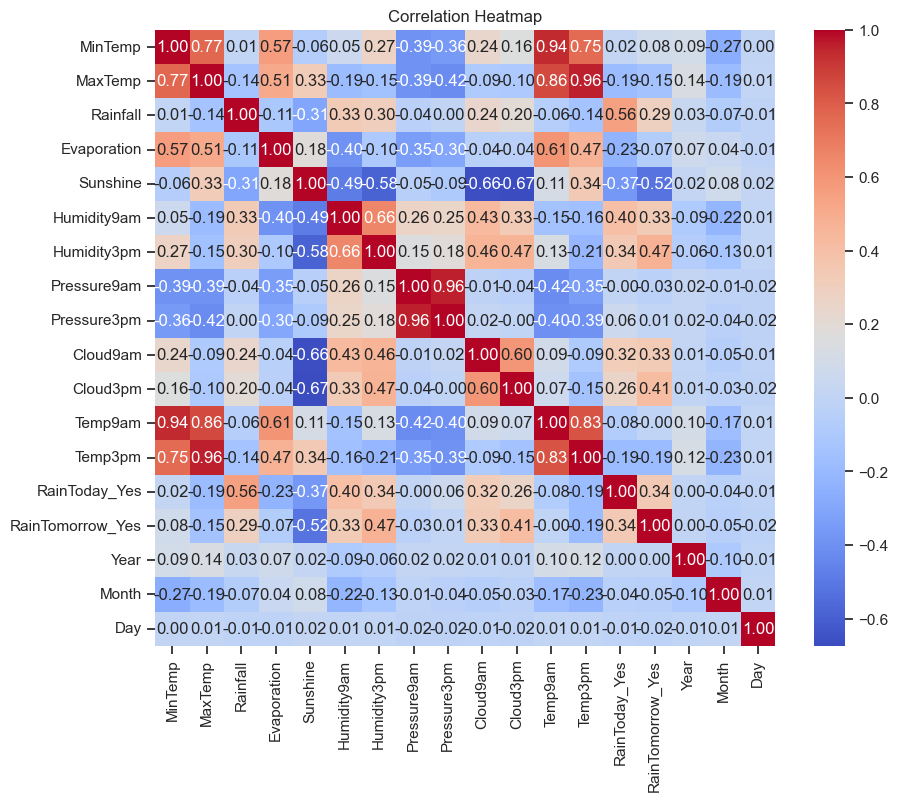

In [182]:
# Calculate correlation coefficients
correlation_matrix = df.corr()
target_correlation = correlation_matrix["RainTomorrow_Yes"].abs().sort_values(ascending=False)
print(target_correlation)

# Visualize correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

# X-y Split 

In [21]:
X = df.loc[:,df.columns!="RainTomorrow_Yes"]
type(X)

pandas.core.frame.DataFrame

In [22]:
X.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,Year,Month,Day
0,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1,2008,2,1
1,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,1,2008,2,2
2,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,1,2008,2,3
3,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,1,2008,2,4
4,19.7,25.7,77.4,4.8,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,1,2008,2,5


In [23]:
y=df['RainTomorrow_Yes']

In [24]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: RainTomorrow_Yes, dtype: uint8

# Test-Train Split

In [25]:
from sklearn.model_selection import train_test_split

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2,random_state=0)

In [27]:
X_train.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,Year,Month,Day
245,22.5,34.8,0.0,8.6,9.8,41.0,20.0,1014.8,1010.300,1.0,7.0,29.6,33.9,0,2008,10,3
2258,6.6,21.3,0.0,2.6,9.4,49.0,22.0,1007.6,999.600,0.0,1.0,11.9,20.7,0,2014,7,9
242,11.9,19.2,0.8,6.4,11.1,61.0,48.0,1020.3,1016.777,2.0,1.0,16.5,19.0,0,2008,9,30
2747,17.7,20.1,18.2,9.0,0.0,81.0,70.0,1014.4,1013.400,8.0,8.0,18.7,18.9,1,2015,11,14
2982,9.5,17.7,0.2,4.4,4.8,54.0,47.0,1004.0,1003.000,6.0,6.0,12.9,15.9,0,2016,7,6


In [28]:
X_train.shape

(2669, 17)

In [29]:
X_test.shape

(668, 17)

# Training Classification Tree

In [30]:
from sklearn import tree
clftree = tree.DecisionTreeClassifier(max_depth = 3)

In [31]:
clftree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

# Predict values using trained model

In [32]:
y_train_pred=clftree.predict(X_train)
y_test_pred=clftree.predict(X_test)

In [33]:
y_test_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,

# Model Performance

In [34]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [35]:
confusion_matrix(y_train, y_train_pred)

array([[1779,  183],
       [ 281,  426]], dtype=int64)

In [36]:
confusion_matrix(y_test, y_test_pred)

array([[460,  50],
       [ 75,  83]], dtype=int64)

In [37]:
accuracy_score(y_test, y_test_pred)

0.812874251497006

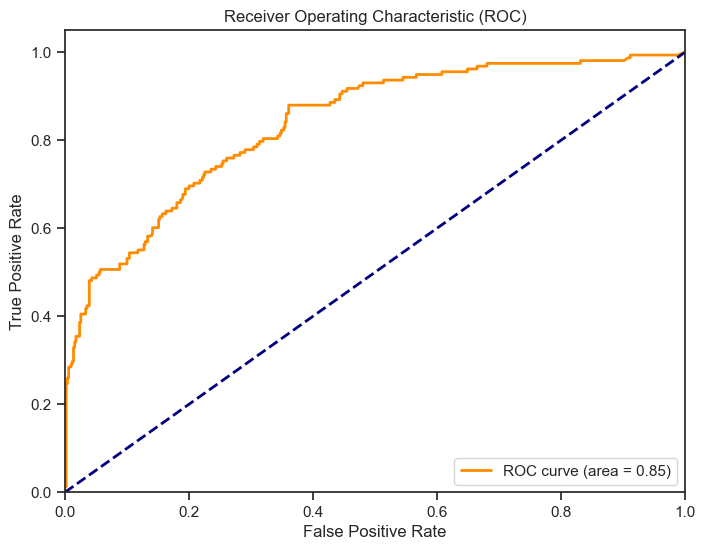

In [200]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities =y_test_pred
#positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Plotting decision tree

In [38]:
dot_data = tree.export_graphviz(clftree, out_file=None,feature_names= X_train.columns, filled = True)

In [39]:
from IPython.display import Image

In [40]:
import pydotplus

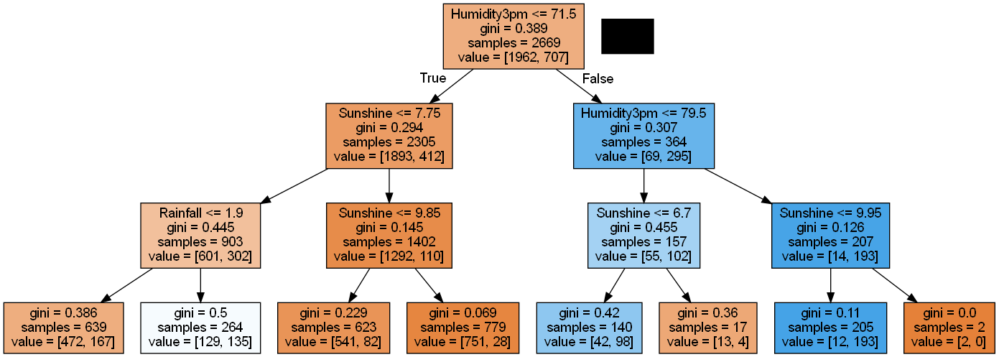

In [41]:
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

# Controlling Tree growth

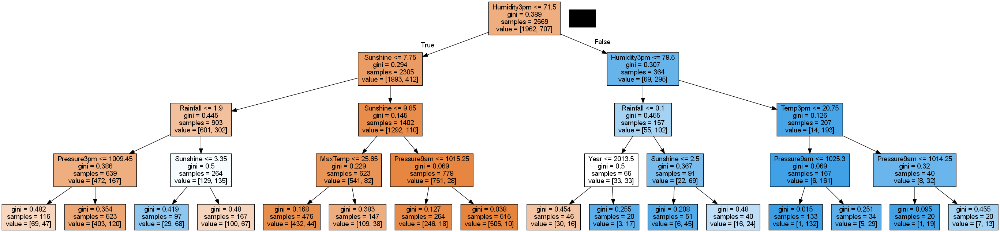

In [42]:
clftreecontr = tree.DecisionTreeClassifier(min_samples_leaf = 20, max_depth=4)
clftreecontr.fit(X_train, y_train)
dot_data = tree.export_graphviz(clftreecontr, out_file=None,feature_names= X_train.columns, filled = True)
graph2 = pydotplus.graph_from_dot_data(dot_data)
Image(graph2.create_png())

In [43]:
accuracy_score(y_test, clftreecontr.predict(X_test))

0.8278443113772455

# Bagging

In [156]:
from sklearn import tree
Bagging_tree = tree.DecisionTreeClassifier()

In [157]:
from sklearn.ensemble import BaggingClassifier

In [158]:
bag_clf = BaggingClassifier(base_estimator=clftree, n_estimators=1000,
                            bootstrap=True, n_jobs=-1,
                            random_state=42)

In [159]:
bag_clf.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                  n_estimators=1000, n_jobs=-1, random_state=42)

# Model Performance

In [160]:
confusion_matrix(y_test,bag_clf.predict(X_test))

array([[490,  20],
       [ 82,  76]], dtype=int64)

In [165]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test,bag_clf.predict(X_test))

0.8473053892215568

In [164]:
from sklearn.metrics import classification_report
report = classification_report(y_test, bag_clf.predict(X_test))

print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.96      0.91       510
           1       0.79      0.48      0.60       158

    accuracy                           0.85       668
   macro avg       0.82      0.72      0.75       668
weighted avg       0.84      0.85      0.83       668



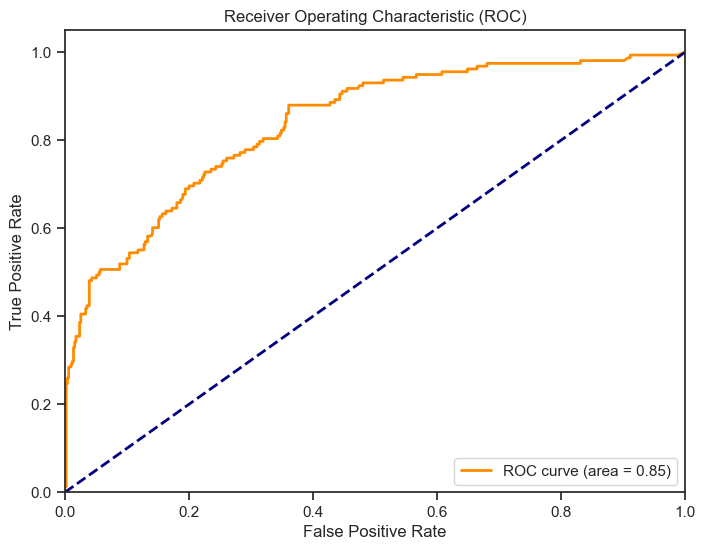

In [197]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities = bag_clf.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Random Forrest

In [51]:
from sklearn.ensemble import RandomForestClassifier

In [52]:
rf_clf = RandomForestClassifier(n_estimators=1000, n_jobs=-1 ,random_state=42)

In [194]:
rf_clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=250, random_state=42)

In [54]:
confusion_matrix(y_test, rf_clf.predict(X_test))

array([[482,  28],
       [ 80,  78]], dtype=int64)

In [55]:
accuracy_score=accuracy_score(y_test, rf_clf.predict(X_test))
print('accuracy_score:',accuracy_score)

accuracy_score: 0.8383233532934131


# Report

In [56]:
report = classification_report(y_test, rf_clf.predict(X_test))

print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90       510
           1       0.74      0.49      0.59       158

    accuracy                           0.84       668
   macro avg       0.80      0.72      0.75       668
weighted avg       0.83      0.84      0.83       668



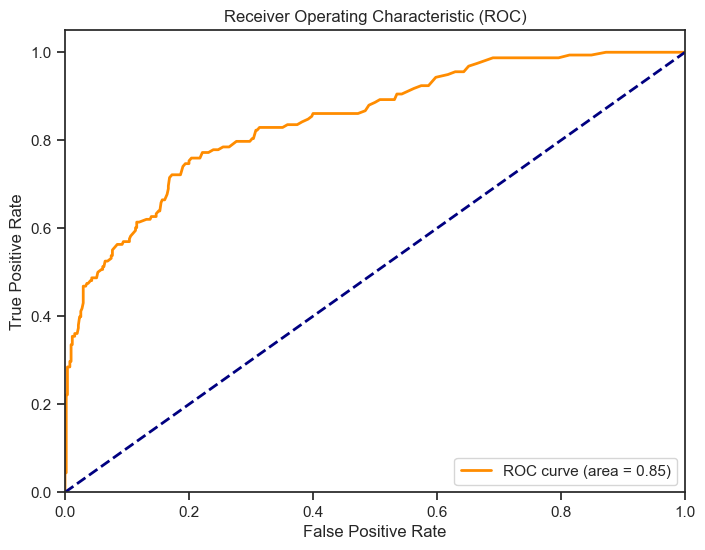

In [195]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities = rf_clf.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Grid Search


In [57]:
from sklearn.model_selection import GridSearchCV

In [58]:
rf_clf = RandomForestClassifier(n_estimators=250,random_state=42)

In [59]:
params_grid = {"max_features" : [4,5,6,7,8,9,10],
              "min_samples_split": [2, 3, 10],
              }

In [61]:
grid_search = GridSearchCV(rf_clf, params_grid,
                           n_jobs=-1, cv=5, scoring='accuracy')

In [62]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(n_estimators=250,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_features': [4, 5, 6, 7, 8, 9, 10],
                         'min_samples_split': [2, 3, 10]},
             scoring='accuracy')

In [63]:
grid_search.best_params_ 

{'max_features': 6, 'min_samples_split': 3}

In [64]:
cvrf_clf = grid_search.best_estimator_

In [68]:
confusion_matrix(y_test, cvrf_clf.predict(X_test))

array([[479,  31],
       [ 78,  80]], dtype=int64)

In [70]:
from sklearn.metrics import accuracy_score
accuracy_score=accuracy_score(y_test, cvrf_clf.predict(X_test))

In [71]:
print('accuracy_score:',accuracy_score)

accuracy_score: 0.8368263473053892


# Report

In [67]:
report = classification_report(y_test, cvrf_clf.predict(X_test))

print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.94      0.90       510
           1       0.72      0.51      0.59       158

    accuracy                           0.84       668
   macro avg       0.79      0.72      0.75       668
weighted avg       0.83      0.84      0.83       668



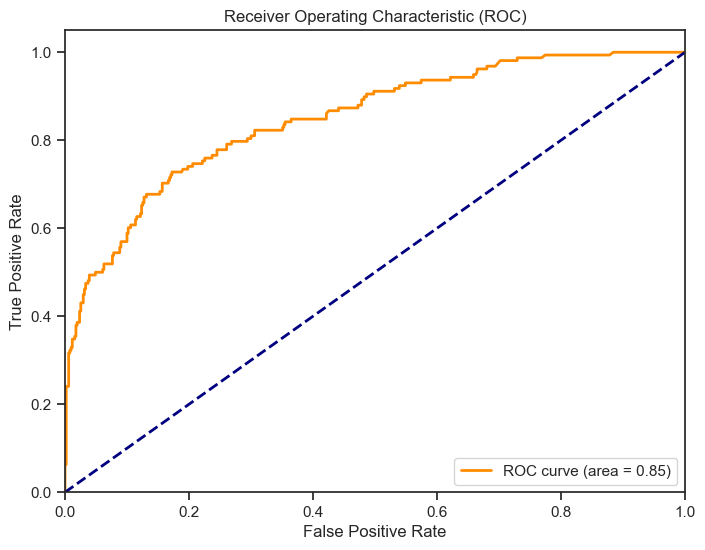

In [192]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities = cvrf_clf.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Gradient Boosting


In [72]:
from sklearn.ensemble import GradientBoostingClassifier

In [73]:
gbc_clf = GradientBoostingClassifier()
gbc_clf.fit(X_train, y_train)

GradientBoostingClassifier()

In [77]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, gbc_clf.predict(X_test))

0.8353293413173652

In [74]:
gbc_clf2 = GradientBoostingClassifier(learning_rate =0.02, n_estimators =1000, max_depth = 1)
gbc_clf2.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.02, max_depth=1, n_estimators=1000)

In [79]:
from sklearn.metrics import accuracy_score

accuracy_score(y_train, gbc_clf2.predict(X_train))

0.8475084301236419

In [80]:
confusion_matrix(y_test, gbc_clf.predict(X_test))

array([[481,  29],
       [ 81,  77]], dtype=int64)

In [81]:
accuracy_score=accuracy_score(y_test, gbc_clf2.predict(X_test))
print('accuracy_score:',accuracy_score)

accuracy_score: 0.8398203592814372


# Report 

In [82]:
from sklearn.metrics import classification_report
report = classification_report(y_test, gbc_clf2.predict(X_test))

print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90       510
           1       0.75      0.48      0.59       158

    accuracy                           0.84       668
   macro avg       0.80      0.72      0.74       668
weighted avg       0.83      0.84      0.83       668



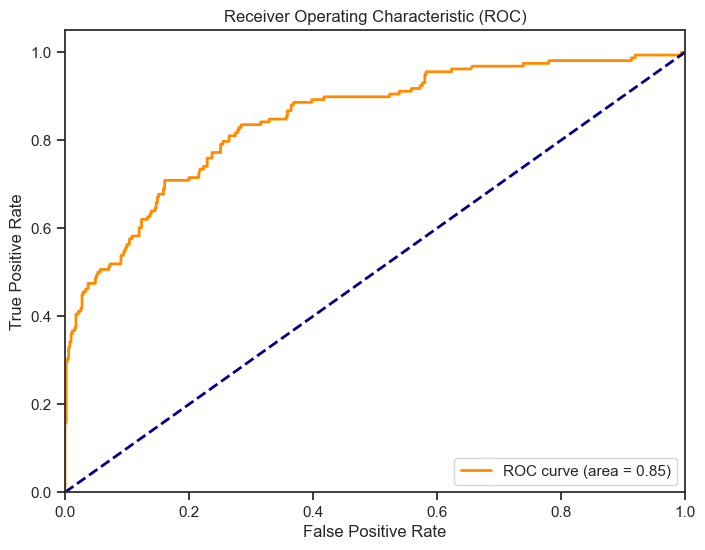

In [191]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities = gbc_clf2.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Ada Boost


In [84]:
from sklearn.ensemble import AdaBoostClassifier

In [85]:
ada_clf = AdaBoostClassifier(learning_rate =0.02, n_estimators =5000)

In [86]:
ada_clf.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=0.02, n_estimators=5000)

In [88]:
from sklearn.metrics import accuracy_score

accuracy_score(y_train, ada_clf.predict(X_train))

0.8572499063319595

In [89]:
ada_clf2 = AdaBoostClassifier(rf_clf,learning_rate =0.05, n_estimators =500)

In [90]:
ada_clf2.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(n_estimators=250,
                                                         random_state=42),
                   learning_rate=0.05, n_estimators=500)

In [92]:
accuracy_score(y_test, ada_clf2.predict(X_test))

0.844311377245509

# Report

In [93]:
from sklearn.metrics import classification_report
report = classification_report(y_test, ada_clf2.predict(X_test))

print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90       510
           1       0.75      0.52      0.61       158

    accuracy                           0.84       668
   macro avg       0.80      0.73      0.76       668
weighted avg       0.84      0.84      0.83       668



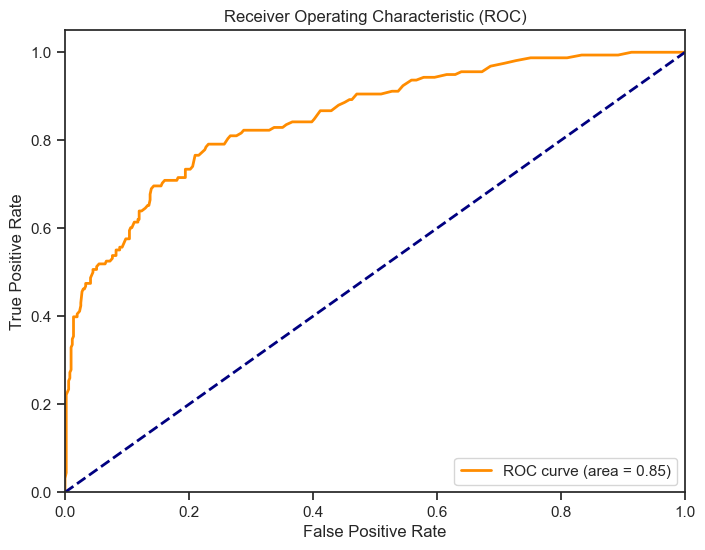

In [190]:
from sklearn.metrics import roc_curve, auc

predicted_probabilities = ada_clf2.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


# XG Boost


In [94]:
import xgboost as xgb

In [95]:
xgb_class = xgb.XGBClassifier(max_depth=5, n_estimators=10000, learning_rate=0.3,
                            n_jobs=-1)

In [96]:
xgb_class.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=10000, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [97]:
accuracy_score(y_test, xgb_class.predict(X_test))

0.8383233532934131

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

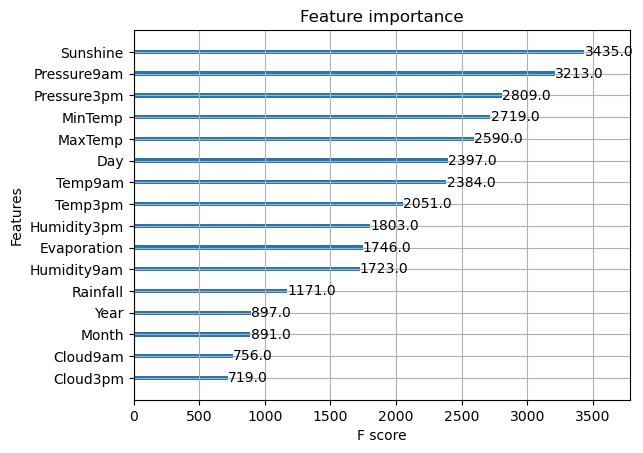

In [98]:
xgb.plot_importance(xgb_class)

In [99]:
xgb_class = xgb.XGBClassifier(n_estimators=250,learning_rate=0.1, random_state=42)

In [100]:
param_test1 = {
 'max_depth':range(3,10,2),
    'gamma' : [0.1,0.2,0.3],
    'subsample':[0.8,0.9],
    'colsample_bytree':[0.8,0.9],
    'reg_alpha':[ 1e-2, 0.1, 1]
}

In [101]:
grid_search = GridSearchCV(xgb_class, param_test1,
                           n_jobs=-1, cv=5, scoring='accuracy')

In [102]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, m...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                  

In [106]:
cvxg_clf = grid_search.best_estimator_


In [107]:
grid_search.best_params_

{'colsample_bytree': 0.9,
 'gamma': 0.1,
 'max_depth': 3,
 'reg_alpha': 0.1,
 'subsample': 0.9}

# Model Performance 

In [109]:
from sklearn.metrics import accuracy_score

accuracy_score=accuracy_score(y_test, cvxg_clf.predict(X_test))
print('accuracy_score:',accuracy_score)

accuracy_score: 0.8398203592814372


# Confusion_Matrix

In [110]:
cm = confusion_matrix(y_test,cvxg_clf.predict(X_test))
print(cm)

[[480  30]
 [ 77  81]]


# Report

In [111]:
from sklearn.metrics import classification_report
report = classification_report(y_test, cvxg_clf.predict(X_test))

In [112]:
print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.94      0.90       510
           1       0.73      0.51      0.60       158

    accuracy                           0.84       668
   macro avg       0.80      0.73      0.75       668
weighted avg       0.83      0.84      0.83       668



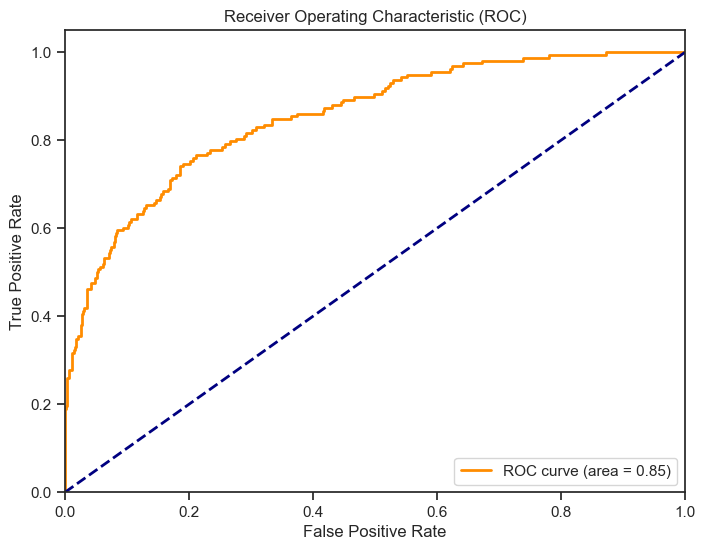

In [189]:

from sklearn.metrics import roc_curve, auc

predicted_probabilities = cvxg_clf.predict_proba(X_test)
positive_class_probabilities = predicted_probabilities[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, positive_class_probabilities)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


In [114]:
df.tail()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,RainTomorrow_Yes,Year,Month,Day
3332,8.6,19.6,0.0,2.0,7.8,73.0,52.0,1025.9,1025.3,2.0,2.0,10.5,17.9,0,0,2017,6,21
3333,9.3,19.2,0.0,2.0,9.2,78.0,53.0,1028.5,1024.6,2.0,2.0,11.0,18.7,0,0,2017,6,22
3334,9.4,17.7,0.0,2.4,2.7,85.0,56.0,1020.8,1015.0,6.0,6.0,10.2,17.3,0,0,2017,6,23
3335,10.1,19.3,0.0,1.4,9.3,56.0,35.0,1017.3,1015.1,5.0,2.0,12.4,19.0,0,0,2017,6,24
3336,7.6,19.3,0.0,3.4,9.4,73.0,32.0,1018.6,1015.4,1.0,1.0,9.4,18.8,0,0,2017,6,25


In [115]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,RainTomorrow_Yes,Year,Month,Day
0,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1,1,2008,2,1
1,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,1,1,2008,2,2
2,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,1,1,2008,2,3
3,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,1,1,2008,2,4
4,19.7,25.7,77.4,4.8,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,1,1,2008,2,5


In [176]:


# List of model names
model_names = ['DecisionTree', 'Bagging DecisionTree', 'Random Forrest','Ada Boost','XG Boost',]

# List of accuracy scores for each model
accuracy_scores = [0.81,  0.85, 0.84,0.84,0.84]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


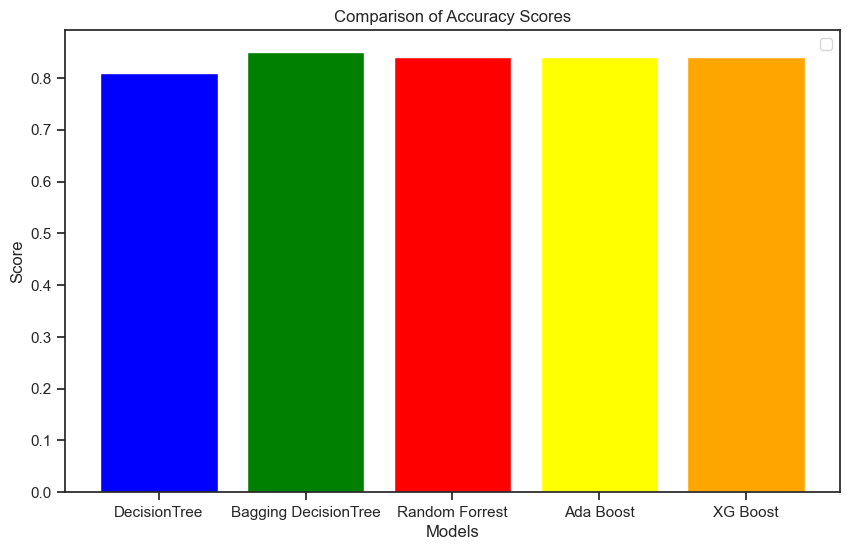

In [177]:
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracy_scores, color=['blue','green','red','yellow','orange'])
plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Accuracy Scores')
plt.legend()
plt.show()


Here We are Using Decision Tree with BaggingClassifier because of  higher accuracy than another model  and also comparing with other metrics it's better perform.

In [138]:
#import joblib


In [166]:
#joblib.dump(bag_clf,'model_joblib')

['model_joblib']

for checking prediction open whther_prediction_model.

1.Your views about the problem statement?
 ANS:-  The goal is to improve the accuracy of rainfall predictions by applying  ensemble methods, which combine multiple individual models to make more accurate predictions. Predicting weather patterns, like rainfall, is a challenging task due to the complex nature of atmospheric processes. Ensemble methods are a suitable choice for this problem because they have the potential to capture various factors that contribute to rainfall and provide more accurate predictions.The task involves several steps, including data preprocessing, feature engineering, selecting appropriate ensemble methods (e.g., Random Forest, Bagging, Boosting), training and evaluating models, and choosing the one with the best accuracy. It's important to ensure the quality of the data and select relevant features that have a significant impact on rainfall prediction.

2.What will be your approach to solving this task?
ANS- The following Steps are follow
1)Data Importing and preprocessing 
Explore the dataset to understand its structure, check for missing values, and identify potential outliers.
2)Data Preprocessing:
fill the mediun value  based on the nature of the data and the impact on the prediction task.
Convert categorical variables into numerical representations using getdummy method.
3)Ensemble Methods:
Implement and experiment with different ensemble methods, such as Random Forest, Bagging (with Decision Trees),XGBoost and AdaBoost
For Random Forest and Bagging, train multiple decision tree models with bootstrapped samples and aggregated predictions.
For Boosting, train weak learners sequentially, giving more importance to misclassified samples.
4)Model Training and Evaluation
Split the dataset into training and testing sets.
Train each ensemble model on the training set.
Evaluate the models using appropriate evaluation metrics such as accuracy, precision, recall, F1-score.
5)Model Selection:
Select the ensemble method with the best performance based on the evaluation metrics.
6)Deployment:
Deploy the selected ensemble model to a production environment for real-time predictions.


3.What were the available ML model options you had to perform this task?
Ans-
1)Logistic Regression: Simple Linear Model
2)Decision Tree: Tree-based models that make decisions based on features to create a decision path.
3)Random Forest: An ensemble model that combines multiple decision trees to improve accuracy and reduce overfitting.
4)Bagging: An ensemble method that uses multiple instances of a single model  to make predictions and then aggregates the results.
5)Boosting: Another ensemble technique that trains multiple models sequentially, with each new model attempting to correct the errors of the previous ones.
6)Gradient Boosting: A specific type of boosting that builds trees sequentially, focusing on the errors of the previous trees.
7)XGBoost: An optimized and powerful implementation of gradient boosting.

4.Which model’s performance is best and what could be the possible reason for that?
Ans- In my case I am select Decision Tree with BaggingClassifier because of  higher accuracy than another model  and also comparing with other metrics it's better perform..
1)Decision Trees, when grown deep, are prone to overfitting. Bagging helps reduce this overfitting by training multiple trees on different subsets of the data and then averaging their predictions, which leads to a more stable and generalized model.
2)Since Bagging combines predictions from multiple trees, it helps in reducing the variability of individual trees. This means that the model's predictions are more consistent and less sensitive to noise in the data.
3)By combining the predictions of multiple trees, Bagging can capture different patterns and features in the data, leading to improved generalization performance on unseen data.
4)Bagging is generally robust to outliers and noisy data points. Outliers' impact is reduced when predictions are averaged across multiple trees.

5.What steps can you take to improve this selected model’s performance even further?
Ans:-
1)Explore feature engineering techniques to create new features that might capture additional patterns in the data. For example, you could create interaction terms, derive new meaningful features, or transform existing features to better suit the model.
2)Analyze the errors made by the model on the test data. Identify patterns in misclassified instances and try to understand why the model is making those errors. This can lead to insights for further improvements.
3)data is properly preprocessed, including handling missing values, scaling features, and encoding categorical variables appropriately.
4)If possible, collect more data to provide the model with a larger and more diverse set of examples to learn from.